## A cycle of reactions `A <-> B <-> C <-> A`
#### the "closing" of the above cycle (the "return" path from `C` to `A`) is coupled with an "energy donor" reaction:
#### `C + E_High <-> A + E_Low`
#### where `E_High` and `E_Low` are, respectively, the high- and low- energy molecules that drive the cycle (for example, think of ATP/ADP).   
Comparisons are made between results obtained with 3 different time resolutions.

All 1st-order kinetics.    

LAST REVISED: June 3, 2024 (using v. 1.0 beta33)

In [1]:
import set_path      # Importing this module will add the project's home directory to sys.path

Added 'D:\Docs\- MY CODE\BioSimulations\life123-Win7' to sys.path


In [2]:
from experiments.get_notebook_info import get_notebook_basename

from src.modules.chemicals.chem_data import ChemData
from src.modules.reactions.uniform_compartment import UniformCompartment
from src.modules.numerical.numerical import Numerical as num

from src.modules.visualization.graphic_log import GraphicLog

In [3]:
# Initialize the HTML logging
log_file = get_notebook_basename() + ".log.htm"    # Use the notebook base filename for the log file

# Set up the use of some specified graphic (Vue) components
GraphicLog.config(filename=log_file,
                  components=["vue_cytoscape_2"],
                  extra_js="https://cdnjs.cloudflare.com/ajax/libs/cytoscape/3.21.2/cytoscape.umd.js")

-> Output will be LOGGED into the file 'cycles_1.log.htm'


### Initialize the system

In [4]:
# Initialize the system
chem_data = ChemData(names=["A", "B", "C", "E_high", "E_low"])

# Reaction A <-> B, mostly in forward direction (favored energetically)
# Note: all reactions in this experiment have 1st-order kinetics for all species
chem_data.add_reaction(reactants="A", products="B",
                       forward_rate=9., reverse_rate=3.)

# Reaction B <-> C, also favored energetically
chem_data.add_reaction(reactants="B", products="C",
                       forward_rate=8., reverse_rate=4.)

# Reaction C + E_High <-> A + E_Low, also favored energetically, but kinetically slow
# Note that, thanks to the energy donation from E, we can go "upstream" from C, to the higher-energy level of "A"
chem_data.add_reaction(reactants=["C" , "E_high"], products=["A", "E_low"],
                       forward_rate=1., reverse_rate=0.2)

chem_data.describe_reactions()

# Send the plot of the reaction network to the HTML log file
chem_data.plot_reaction_network("vue_cytoscape_2")

Number of reactions: 3 (at temp. 25 C)
0: A <-> B  (kF = 9 / kR = 3 / delta_G = -2,723.4 / K = 3) | 1st order in all reactants & products
1: B <-> C  (kF = 8 / kR = 4 / delta_G = -1,718.3 / K = 2) | 1st order in all reactants & products
2: C + E_high <-> A + E_low  (kF = 1 / kR = 0.2 / delta_G = -3,989.7 / K = 5) | 1st order in all reactants & products
Set of chemicals involved in the above reactions: {'E_high', 'C', 'E_low', 'A', 'B'}
[GRAPHIC ELEMENT SENT TO LOG FILE `cycles_1.log.htm`]


### Set the initial concentrations of all the chemicals

In [5]:
initial_conc = {"A": 100., "E_high": 1000.}  # Note the abundant energy source "E_high"; anything not specified will default to zero
initial_conc

{'A': 100.0, 'E_high': 1000.0}

### We'll split each simulation in three segments (apparent from the graphs of the runs, further down):  
Time [0-0.03] fast changes   
Time [0.03-5.] medium changes   
Time [5.-8.] slow changes, as we approach equilibrium  

### and we'll do MULTIPLE RUNS, at varying time resolutions.

# Run # 1 : FIXED time resolution, with COARSE time steps - broken up in 3 time intervals    
(trial and error, not shown, reveals that increasing any of the time steps below, leads to "excessive time step" errors)

In [6]:
dynamics = UniformCompartment(chem_data=chem_data)
dynamics.set_conc(conc=initial_conc, snapshot=True)
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
5 species:
  Species 0 (A). Conc: 100.0
  Species 1 (B). Conc: 0.0
  Species 2 (C). Conc: 0.0
  Species 3 (E_high). Conc: 1000.0
  Species 4 (E_low). Conc: 0.0
Set of chemicals involved in reactions: {'E_high', 'C', 'E_low', 'A', 'B'}


In [7]:
dynamics.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

In [8]:
dynamics.single_compartment_react(initial_step=0.0008, target_end_time=0.03, variable_steps=False)
#dynamics.get_history()

38 total step(s) taken


In [9]:
dynamics.single_compartment_react(initial_step=0.001, target_end_time=5., variable_steps=False)
#dynamics.get_history()

4970 total step(s) taken


In [10]:
dynamics.single_compartment_react(initial_step=0.005, target_end_time=8., variable_steps=False)

600 total step(s) taken


In [11]:
dynamics.get_history()

,SYSTEM TIME,A,B,C,E_high,E_low,caption
0,0.0000,100.000000,0.000000,0.000000,1000.000000,0.000000,Initialized state
1,0.0008,99.280000,0.720000,0.000000,1000.000000,0.000000,
2,0.0016,98.566912,1.428480,0.004608,1000.000000,0.000000,
3,0.0024,97.864345,2.125606,0.010049,999.996314,0.003686,
4,0.0032,97.172805,2.811556,0.015639,999.988332,0.011668,
...,...,...,...,...,...,...,...
5604,7.9804,10.018545,30.006917,59.974537,32.331113,967.668887,
5605,7.9854,10.018398,30.006862,59.974740,32.330530,967.669470,
5606,7.9904,10.018251,30.006808,59.974942,32.329952,967.670048,
5607,7.9954,10.018105,30.006753,59.975142,32.329378,967.670622,


### Notice we created 5,609 data points

In [12]:
dynamics.explain_time_advance()

From time 0 to 0.0304, in 38 steps of 0.0008
From time 0.0304 to 5, in 4970 steps of 0.001
From time 5 to 8, in 600 steps of 0.005
(5608 steps total)


## Plots of changes of concentration with time

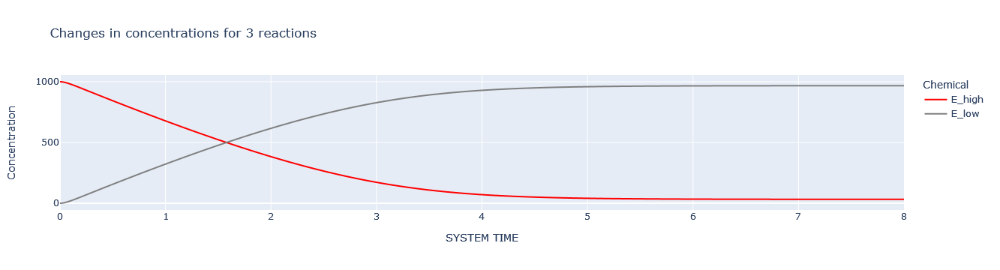

In [13]:
dynamics.plot_history(chemicals=["E_high", "E_low"], colors=["red", "grey"])

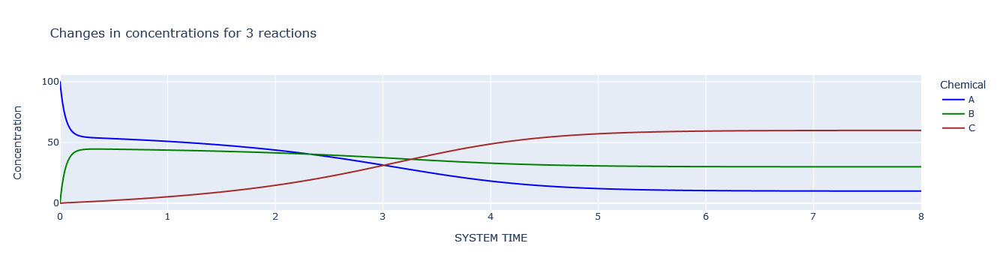

In [14]:
dynamics.plot_history(chemicals=["A", "B", "C"])

### The plots has 4 distinctive intersections; locate them and save them for later comparisons across repeated runs:

In [15]:
run1 = []

In [16]:
run1.append(dynamics.curve_intersect("E_high", "E_low", t_start=1., t_end=2.))

In [17]:
run1.append(dynamics.curve_intersect("A", "B", t_start=2.31, t_end=2.33))

In [18]:
run1.append(dynamics.curve_intersect("A", "C", t_start=3., t_end=4.))

In [19]:
run1.append(dynamics.curve_intersect("B", "C", t_start=3., t_end=4.))

In [20]:
run1

[(1.5782463316015305, 499.9999999999999),
 (2.324208426199163, 40.36968965779538),
 (3.0098252303164066, 31.29187589510951),
 (3.2624567026161637, 36.1939052299051)]

### Verify the final equilibrium state:

In [21]:
dynamics.is_in_equilibrium()

0: A <-> B
Final concentrations: [A] = 10.02 ; [B] = 30.01
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 2.99529
    Formula used:  [B] / [A]
2. Ratio of forward/reverse reaction rates: 3
Discrepancy between the two values: 0.157 %
Reaction IS in equilibrium (within 1% tolerance)

1: B <-> C
Final concentrations: [B] = 30.01 ; [C] = 59.98
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 1.99873
    Formula used:  [C] / [B]
2. Ratio of forward/reverse reaction rates: 2
Discrepancy between the two values: 0.06342 %
Reaction IS in equilibrium (within 1% tolerance)

2: C + E_high <-> A + E_low
Final concentrations: [C] = 59.98 ; [E_high] = 32.33 ; [A] = 10.02 ; [E_low] = 967.7
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 4.99971
    Formula used:  ([A][E_low]) / ([C][E_high])
2. Ratio of forward/reverse reaction rates: 5
Discrepancy between the two values: 0.005823 %
Reaction IS in equilibrium (within 1% t

True

# _NOTE: Everything below is JUST A REPEAT of the same experiment, with different time steps, for accuracy comparisons_

# Run # 2. VARIABLE time resolution

In [22]:
dynamics = UniformCompartment(chem_data=chem_data)   # Note: OVER-WRITING the "dynamics" object
dynamics.set_conc(conc=initial_conc, snapshot=True) 
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
5 species:
  Species 0 (A). Conc: 100.0
  Species 1 (B). Conc: 0.0
  Species 2 (C). Conc: 0.0
  Species 3 (E_high). Conc: 1000.0
  Species 4 (E_low). Conc: 0.0
Set of chemicals involved in reactions: {'C', 'A', 'E_low', 'B', 'E_high'}


In [23]:
dynamics.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

In [24]:
# These settings can be tweaked to make the time resolution finer or coarser
dynamics.set_thresholds(norm="norm_A", low=0.01, high=0.012, abort=0.015)
dynamics.set_thresholds(norm="norm_B", low=0.002, high=0.4, abort=0.5)
dynamics.set_step_factors(upshift=1.6, downshift=0.15, abort=0.05)
dynamics.set_error_step_factor(0.05)

dynamics.single_compartment_react(initial_step=0.0001, target_end_time=8.0,
                                  variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (0.00016) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.05 (set to 8e-06) [Step started at t=0.0001, and will rewind there]
* INFO: the tentative time step (8e-06) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.05 (set to 4e-07) [Step started at t=0.000108, and will rewind there]
* INFO: the tentative time step (0.0017945) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.05 (set to 8.9723e-05) [Step started at t=1.1473, and will rewind there]
* INFO: the tentative time step (0.0015053) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.05 (set to 7.5265e-05) [Step started at t=1.1497, and will rewind t

### Notice we created 9,499 data points, a fair bit more than in run #1

In [25]:
# dynamics.get_history()
# dynamics.explain_time_advance()

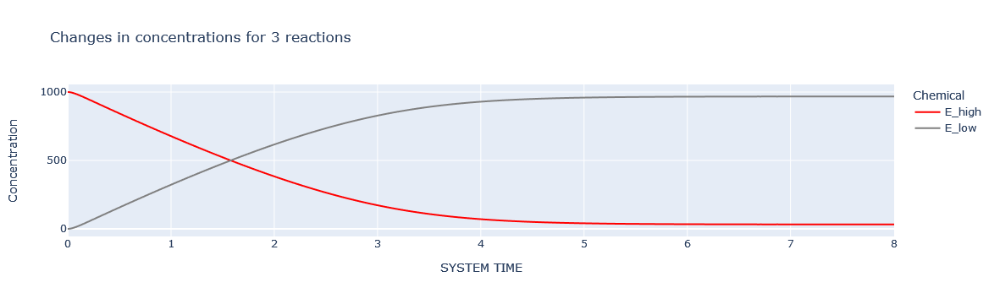

In [26]:
dynamics.plot_history(chemicals=["E_high", "E_low"], colors=["red", "grey"])

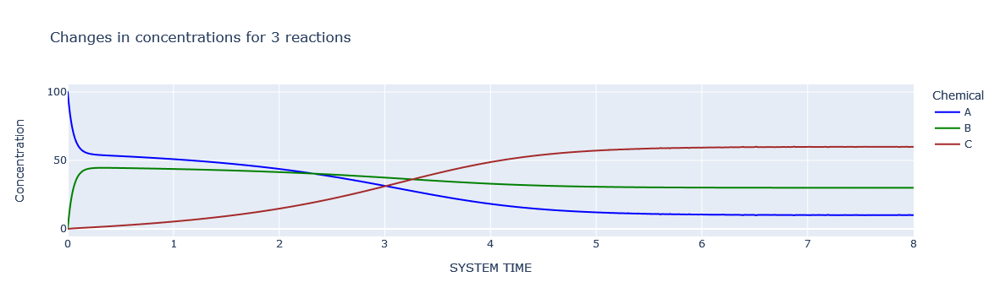

In [27]:
dynamics.plot_history(chemicals=["A", "B", "C"])

### The two plots have 4 distinctive intersections among them; locate and save them:

In [28]:
run2 = []

In [29]:
run2.append(dynamics.curve_intersect(t_start=1., t_end=2., chem1="E_high", chem2="E_low"))  # This can be seen in the 1st plot

In [30]:
run2.append(dynamics.curve_intersect(t_start=2.31, t_end=2.33, chem1="A", chem2="B"))       # This, and later, can be seen in the 2nd plot

In [31]:
run2.append(dynamics.curve_intersect(t_start=3., t_end=4., chem1="A", chem2="C"))

In [32]:
run2.append(dynamics.curve_intersect(t_start=3., t_end=4., chem1="B", chem2="C"))

In [33]:
run2

[(1.5782443251951959, 500.00000000000193),
 (2.3241554672877194, 40.36977692670153),
 (3.009628343990496, 31.291806594658606),
 (3.2621514583960955, 36.19399820581578)]

# Run # 3. FIXED time resolution, using the smallest time substeps from run # 2  
#### (i.e. FINER fixed resolution than in run #1)


In [34]:
dynamics = UniformCompartment(chem_data=chem_data)   # Note: OVER-WRITING the "dynamics" object
dynamics.set_conc(conc=initial_conc, snapshot=True) 
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
5 species:
  Species 0 (A). Conc: 100.0
  Species 1 (B). Conc: 0.0
  Species 2 (C). Conc: 0.0
  Species 3 (E_high). Conc: 1000.0
  Species 4 (E_low). Conc: 0.0
Set of chemicals involved in reactions: {'C', 'A', 'E_low', 'B', 'E_high'}


In [35]:
dynamics.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

In [36]:
dynamics.single_compartment_react(initial_step=0.0004, target_end_time=0.03, variable_steps=False)

75 total step(s) taken


In [37]:
dynamics.single_compartment_react(initial_step=0.0005, target_end_time=5., variable_steps=False)

9940 total step(s) taken


In [38]:
dynamics.single_compartment_react(initial_step=0.0025, target_end_time=8., variable_steps=False)

1200 total step(s) taken


In [39]:
dynamics.get_history()

,SYSTEM TIME,A,B,C,E_high,E_low,caption
0,0.0000,100.000000,0.000000,0.000000,1000.000000,0.000000,Initialized state
1,0.0004,99.640000,0.360000,0.000000,1000.000000,0.000000,
2,0.0008,99.281728,0.717120,0.001152,1000.000000,0.000000,
3,0.0012,98.925635,1.071381,0.002984,999.999539,0.000461,
4,0.0016,98.571979,1.422804,0.005218,999.998349,0.001651,
...,...,...,...,...,...,...,...
11211,7.9900,10.018459,30.006885,59.974656,32.330771,967.669229,
11212,7.9925,10.018385,30.006858,59.974757,32.330481,967.669519,
11213,7.9950,10.018312,30.006830,59.974858,32.330192,967.669808,
11214,7.9975,10.018239,30.006803,59.974958,32.329904,967.670096,


### Notice we created 11,217 data points, a fair bit more than in run #2, and a good deal more than in run #1

In [40]:
dynamics.explain_time_advance()

From time 0 to 0.03, in 75 steps of 0.0004
From time 0.03 to 5, in 9940 steps of 0.0005
From time 5 to 8, in 1200 steps of 0.0025
(11215 steps total)


## Plots of changes of concentration with time

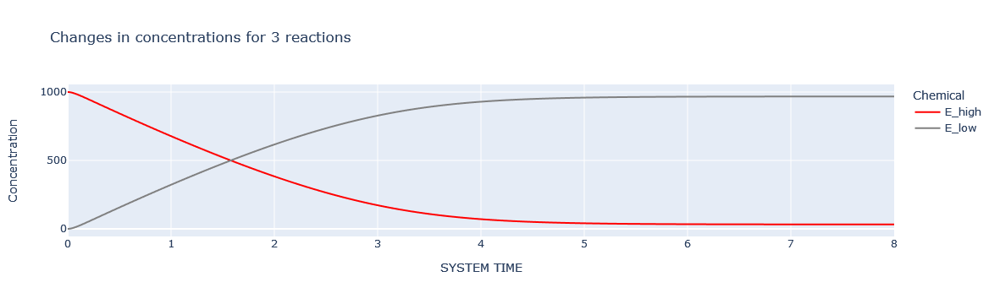

In [41]:
dynamics.plot_history(chemicals=["E_high", "E_low"], colors=["red", "grey"])

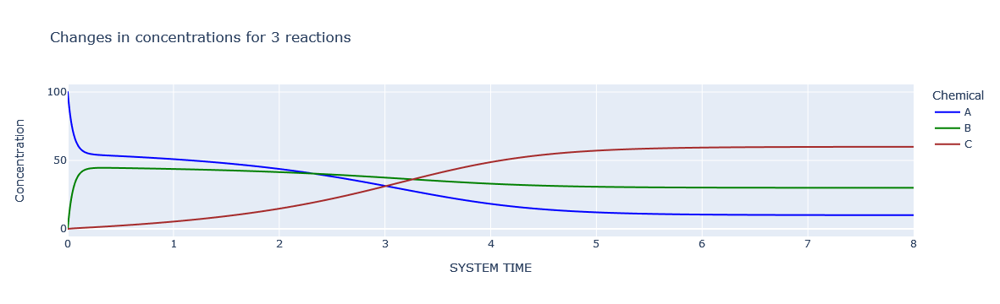

In [42]:
dynamics.plot_history(chemicals=["A", "B", "C"])

### Again, the two plots have 4 distinctive intersections among them; locate and save them:

In [43]:
run3 = []

In [44]:
run3.append(dynamics.curve_intersect(t_start=1., t_end=2., chem1="E_high", chem2="E_low"))

In [45]:
run3.append(dynamics.curve_intersect(t_start=2.31, t_end=2.33, chem1="A", chem2="B"))

In [46]:
run3.append(dynamics.curve_intersect(t_start=3., t_end=4., chem1="A", chem2="C"))

In [47]:
run3.append(dynamics.curve_intersect(t_start=3., t_end=4., chem1="B", chem2="C"))

In [48]:
run3

[(1.5782924165400347, 500.00000000000097),
 (2.324314772661154, 40.369610560733825),
 (3.0100101552808494, 31.29190450449909),
 (3.262685299694276, 36.193867736703666)]

# Finally, compare (using a Euclidean metric) the discrepancy between the runs
Run #3, at high resolution, could be thought of as "the closest to the actual values"

In [49]:
# Discrepancy of run1 from run3
num.compare_results(run1, run3)

0.00032919271043321753

In [50]:
# Discrepancy of run2 from run3
num.compare_results(run2, run3)

0.0007160611243663918

The fact that our measure of distance of run 2 (with intermediate resolution) from run3 is actually a little GREATER than the distance of run 1 (with low resolution) from run3, might be an artifact of the limited accuracy in the extraction of intersection coordinates from the saved run data.

#### The coordinates of the 4 critical points, from the 3 different runs, are pretty similar to one another - as can be easily seen:

In [51]:
run1

[(1.5782463316015305, 499.9999999999999),
 (2.324208426199163, 40.36968965779538),
 (3.0098252303164066, 31.29187589510951),
 (3.2624567026161637, 36.1939052299051)]

In [52]:
run2

[(1.5782443251951959, 500.00000000000193),
 (2.3241554672877194, 40.36977692670153),
 (3.009628343990496, 31.291806594658606),
 (3.2621514583960955, 36.19399820581578)]

In [53]:
run3

[(1.5782924165400347, 500.00000000000097),
 (2.324314772661154, 40.369610560733825),
 (3.0100101552808494, 31.29190450449909),
 (3.262685299694276, 36.193867736703666)]